In [1]:
import pymysql
from sqlalchemy import create_engine
import pandas as pd
import getpass  # To get the password without showing the input
password = getpass.getpass()

········


### Import librairies

In [2]:
import pandas as pd
import numpy as np
import datetime
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns', None)
import re

### Import Data from SQL

In [3]:
connection_string = 'mysql+pymysql://root:' + password + '@localhost/credit_card_classification'
engine = create_engine(connection_string)

In [4]:
engine.execute("USE credit_card_classification")

In [5]:
result = engine.execute('SELECT * FROM credit_card_data')
for row in result:
    print(row)
rows = [row for row in result]
pd.DataFrame(rows)

(1, 'No', 'Air Miles', 'Letter', 'High', 1, 'No', 'High', 2, 1, 4, 'No', 1160.75, 1669, 877, 1095)
(2, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Medium', 2, 2, 5, 'Yes', 147.25, 39, 106, 78)
(3, 'No', 'Air Miles', 'Postcard', 'High', 2, 'No', 'Medium', 2, 1, 2, 'Yes', 276.5, 367, 352, 145)
(4, 'No', 'Air Miles', 'Letter', 'Medium', 2, 'No', 'High', 1, 1, 4, 'No', 1219.0, 1578, 1760, 1119)
(5, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Medium', 2, 1, 6, 'Yes', 1211.0, 2140, 1357, 982)
(6, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'High', 3, 1, 4, 'No', 1114.75, 1847, 1365, 750)
(7, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Medium', 2, 1, 3, 'No', 283.75, 468, 188, 347)
(8, 'No', 'Cash Back', 'Postcard', 'Low', 1, 'No', 'Medium', 4, 1, 4, 'Yes', 278.5, 132, 391, 285)
(9, 'No', 'Air Miles', 'Postcard', 'Medium', 1, 'No', 'Low', 2, 1, 4, 'Yes', 1005.0, 894, 891, 882)
(10, 'No', 'Air Miles', 'Letter', 'High', 2, 'No', 'Low', 3, 2, 4, 'Yes', 974.25, 1814, 1454, 514)

(1506, 'No', 'Points', 'Postcard', 'Medium', 1, 'No', 'High', 1, 1, 3, 'Yes', 948.25, 2, 1136, 1297)
(1507, 'No', 'Cash Back', 'Postcard', 'Low', 1, 'No', 'High', 3, 1, 3, 'No', 931.5, 498, 434, 1193)
(1508, 'No', 'Air Miles', 'Letter', 'High', 1, 'No', 'Low', 1, 1, 4, 'No', 1200.75, 1845, 1471, 698)
(1509, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'Medium', 1, 1, 5, 'Yes', 1003.5, 1908, 1082, 905)
(1510, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Low', 1, 2, 3, 'No', 257.75, 343, 467, 46)
(1511, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'Low', 3, 2, 5, 'Yes', 1018.5, 760, 769, 1687)
(1512, 'No', 'Points', 'Postcard', 'Medium', 1, 'No', 'Medium', 1, 2, 3, 'Yes', 1441.25, 864, 1513, 2022)
(1513, 'No', 'Points', 'Postcard', 'Low', 2, 'No', 'Medium', 1, 1, 4, 'No', 1009.5, 921, 817, 1693)
(1514, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'Medium', 2, 1, 2, 'No', 858.25, 668, 989, 997)
(1515, 'No', 'Cash Back', 'Postcard', 'Low', 1, 'No', 'Low', 3, 1, 4, 'Yes', 1191.5, 1815,

(2796, 'Yes', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Low', 1, 1, 3, 'Yes', 1242.5, 472, 1227, 1671)
(2797, 'No', 'Cash Back', 'Letter', 'Medium', 2, 'Yes', 'Medium', 2, 2, 3, 'Yes', 1056.75, 1441, 1199, 968)
(2798, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'High', 2, 2, 4, 'Yes', 1737.5, 1785, 1563, 1624)
(2799, 'No', 'Cash Back', 'Postcard', 'Low', 2, 'No', 'Medium', 1, 1, 3, 'Yes', 1084.75, 192, 1057, 963)
(2800, 'No', 'Air Miles', 'Postcard', 'High', 1, 'No', 'High', 3, 1, 4, 'Yes', 1066.75, 462, 1331, 1483)
(2801, 'No', 'Cash Back', 'Letter', 'High', 1, 'No', 'Medium', 2, 2, 3, 'Yes', 1016.25, 1749, 1392, 716)
(2802, 'Yes', 'Points', 'Letter', 'High', 1, 'No', 'Low', 2, 2, 3, 'Yes', 1193.0, 2035, 1481, 677)
(2803, 'No', 'Points', 'Letter', 'Medium', 1, 'Yes', 'Medium', 2, 2, 2, 'Yes', 306.5, 191, 340, 431)
(2804, 'No', 'Air Miles', 'Postcard', 'Low', 1, 'No', 'Medium', 1, 1, 6, 'Yes', 331.0, 472, 371, 219)
(2805, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'Yes', 'Medium'

(3763, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Low', 3, 1, 5, 'Yes', 1170.75, 1226, 505, 1332)
(3764, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Low', 1, 1, 3, 'No', 152.25, 84, 82, 320)
(3765, 'No', 'Cash Back', 'Letter', 'High', 1, 'No', 'High', 1, 2, 3, 'Yes', 887.75, 210, 801, 835)
(3766, 'No', 'Cash Back', 'Letter', 'Medium', 2, 'No', 'Medium', 2, 1, 3, 'No', 941.75, 1593, 1184, 878)
(3767, 'No', 'Points', 'Letter', 'Low', 2, 'Yes', 'High', 1, 1, 3, 'Yes', 1042.75, 1375, 1056, 806)
(3768, 'No', 'Points', 'Postcard', 'Medium', 1, 'No', 'Medium', 1, 2, 4, 'Yes', 1038.5, 1825, 1329, 914)
(3769, 'No', 'Points', 'Letter', 'Medium', 2, 'Yes', 'High', 2, 2, 3, 'No', 327.5, 406, 372, 305)
(3770, 'No', 'Cash Back', 'Letter', 'High', 1, 'No', 'Low', 3, 1, 4, 'No', 1147.5, 275, 444, 2008)
(3771, 'No', 'Points', 'Letter', 'Medium', 1, 'Yes', 'Medium', 3, 1, 4, 'No', 274.25, 13, 343, 392)
(3772, 'Yes', 'Air Miles', 'Postcard', 'High', 1, 'No', 'Medium', 2, 1, 5, 'Yes', 1129.75

(4462, 'No', 'Points', 'Letter', 'Low', 2, 'No', 'Low', 2, 2, 4, 'Yes', 1357.75, 1090, 1027, 1668)
(4463, 'No', 'Air Miles', 'Letter', 'High', 1, 'Yes', 'Low', 2, 1, 3, 'No', 952.75, 73, 1488, 1545)
(4464, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'Low', 1, 1, 3, 'Yes', 1052.5, 674, 1522, 1431)
(4465, 'Yes', 'Points', 'Letter', 'Low', 2, 'No', 'Low', 1, 1, 4, 'Yes', 628.75, 742, 541, 636)
(4466, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'Medium', 2, 1, 3, 'Yes', 1101.75, 1781, 1320, 994)
(4467, 'No', 'Cash Back', 'Postcard', 'High', 1, 'Yes', 'High', 2, 1, 3, 'Yes', 787.5, 578, 959, 733)
(4468, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Low', 1, 2, 5, 'Yes', 1174.0, 73, 1050, 1579)
(4469, 'No', 'Cash Back', 'Letter', 'Low', 1, 'No', 'High', 2, 1, 4, 'Yes', 1153.5, 72, 1184, 1780)
(4470, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'High', 4, 1, 4, 'Yes', 1024.0, 1223, 1511, 801)
(4471, 'No', 'Cash Back', 'Letter', 'Low', 1, 'No', 'High', 1, 2, 4, 'Yes', 1367.5, 980, 1261, 2

(4872, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'High', 2, 2, 4, 'No', 912.0, 866, 478, 861)
(4873, 'No', 'Cash Back', 'Letter', 'High', 1, 'Yes', 'Medium', 1, 1, 4, 'Yes', 1068.75, 1951, 1344, 942)
(4874, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'High', 2, 1, 4, 'Yes', 190.75, 132, 306, 166)
(4875, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'High', 2, 1, 2, 'Yes', 1233.5, 1908, 1346, 1385)
(4876, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'High', 2, 1, 2, 'Yes', 175.0, 192, 132, 44)
(4877, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Medium', 3, 1, 3, 'No', 1101.25, 1677, 1446, 922)
(4878, 'No', 'Air Miles', 'Postcard', 'Medium', 1, 'No', 'Low', 3, 1, 3, 'No', 1046.0, 1907, 1068, 992)
(4879, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'Yes', 'Low', 1, 1, 6, 'Yes', 1223.75, 1794, 1446, 1310)
(4880, 'No', 'Points', 'Letter', 'High', 1, 'No', 'Low', 3, 1, 5, 'No', 723.25, 653, 904, 763)
(4881, 'No', 'Points', 'Letter', 'Low', 2, 'No', 'Low', 3, 1, 3, 'No', 947.75, 267, 

(5964, 'No', 'Air Miles', 'Postcard', 'Low', 1, 'No', 'Medium', 4, 1, 3, 'Yes', 201.5, 479, 287, 32)
(5965, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Medium', 1, 1, 3, 'Yes', 179.0, 416, 5, 163)
(5966, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'High', 1, 1, 5, 'No', 740.75, 918, 830, 569)
(5967, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Low', 1, 3, 5, 'No', 1016.75, 1973, 1220, 862)
(5968, 'No', 'Cash Back', 'Letter', 'Medium', 2, 'No', 'High', 2, 1, 3, 'No', 1085.5, 498, 1123, 1407)
(5969, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Low', 1, 1, 4, 'No', 736.0, 646, 786, 665)
(5970, 'No', 'Points', 'Letter', 'Low', 1, 'No', 'Low', 1, 1, 3, 'No', 698.25, 626, 616, 863)
(5971, 'No', 'Points', 'Letter', 'Low', 2, 'No', 'Medium', 1, 1, 4, 'No', 1926.25, 1962, 1955, 1930)
(5972, 'No', 'Points', 'Postcard', 'Medium', 1, 'No', 'Medium', 3, 1, 3, 'Yes', 1048.0, 1760, 1121, 1064)
(5973, 'No', 'Points', 'Letter', 'Low', 1, 'No', 'High', 1, 2, 2, 'Yes', 1007.75, 1642, 1361,

(6965, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Medium', 2, 1, 4, 'Yes', 1173.25, 871, 924, 1390)
(6966, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'High', 1, 1, 3, 'Yes', 891.75, 1796, 1182, 562)
(6967, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'Low', 1, 1, 3, 'No', 582.25, 538, 550, 543)
(6968, 'No', 'Air Miles', 'Letter', 'High', 1, 'No', 'High', 3, 1, 4, 'Yes', 935.75, 283, 1412, 1379)
(6969, 'No', 'Air Miles', 'Letter', 'Medium', 2, 'Yes', 'High', 1, 1, 2, 'Yes', 794.0, 864, 657, 718)
(6970, 'No', 'Cash Back', 'Letter', 'Medium', 2, 'No', 'High', 2, 1, 4, 'Yes', 1056.0, 813, 616, 1515)
(6971, 'No', 'Air Miles', 'Letter', 'Medium', 2, 'No', 'High', 4, 1, 3, 'Yes', 124.0, 79, 246, 4)
(6972, 'No', 'Cash Back', 'Postcard', 'Low', 1, 'No', 'Medium', 2, 2, 6, 'Yes', 1156.5, 576, 448, 1657)
(6973, 'No', 'Air Miles', 'Postcard', 'Low', 1, 'No', 'High', 1, 1, 4, 'No', 1017.25, 2006, 1192, 673)
(6974, 'No', 'Air Miles', 'Letter', 'High', 2, 'No', 'High', 2, 1, 3, 'Yes', 830.2

(8467, 'No', 'Points', 'Postcard', 'Medium', 2, 'No', 'Medium', 2, 1, 5, 'No', 1161.0, 348, 1108, 1251)
(8468, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'Low', 1, 1, 5, 'No', 1305.25, 813, 1732, 1922)
(8469, 'Yes', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Medium', 1, 1, 5, 'No', 885.75, 1594, 1012, 648)
(8470, 'No', 'Cash Back', 'Postcard', 'High', 2, 'No', 'High', 2, 2, 3, 'Yes', 801.5, 675, 850, 765)
(8471, 'No', 'Cash Back', 'Letter', 'Low', 2, 'No', 'High', 1, 1, 3, 'No', 1011.25, 1224, 1463, 589)
(8472, 'No', 'Points', 'Letter', 'Medium', 2, 'No', 'Medium', 2, 1, 1, 'Yes', 243.75, 157, 309, 299)
(8473, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Medium', 2, 1, 4, 'Yes', 1303.5, 159, 1690, 2059)
(8474, 'No', 'Cash Back', 'Postcard', 'High', 1, 'No', 'Low', 2, 1, 4, 'Yes', 1052.25, 1959, 1075, 737)
(8475, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'High', 1, 1, 5, 'Yes', 962.75, 532, 984, 1436)
(8476, 'No', 'Air Miles', 'Letter', 'High', 1, 'No', 'Medium', 1, 2, 5, '

(9375, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Low', 3, 1, 3, 'No', 661.75, 675, 711, 725)
(9376, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'Low', 1, 1, 3, 'No', 1172.0, 661, 1208, 1685)
(9377, 'No', 'Cash Back', 'Postcard', 'Medium', 2, 'No', 'High', 1, 1, 5, 'No', 1067.5, 510, 933, 838)
(9378, 'No', 'Points', 'Postcard', 'Medium', 1, 'No', 'Medium', 2, 1, 5, 'Yes', 716.0, 584, 842, 879)
(9379, 'No', 'Air Miles', 'Postcard', 'High', 1, 'No', 'High', 2, 1, 6, 'No', 956.25, 1563, 1157, 803)
(9380, 'No', 'Points', 'Postcard', 'Medium', 2, 'No', 'Low', 2, 2, 3, 'No', 718.5, 774, 651, 820)
(9381, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'Medium', 1, 1, 2, 'No', 1147.0, 957, 922, 882)
(9382, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'High', 3, 2, 5, 'Yes', 826.75, 809, 802, 849)
(9383, 'No', 'Air Miles', 'Postcard', 'High', 2, 'No', 'High', 2, 2, 3, 'Yes', 1028.75, 1981, 1184, 761)
(9384, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'High', 2, 1, 4, 'No', 243.5, 375, 148, 1

(10380, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Low', 1, 1, 4, 'No', 1022.0, 108, 1336, 1639)
(10381, 'Yes', 'Air Miles', 'Postcard', 'Medium', 1, 'No', 'High', 2, 1, 5, 'Yes', 1214.25, 927, 1340, 1743)
(10382, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'High', 3, 2, 3, 'Yes', 1194.25, 809, 1538, 1620)
(10383, 'No', 'Points', 'Letter', 'Low', 1, 'No', 'Medium', 2, 1, 2, 'Yes', 262.0, 273, 273, 465)
(10384, 'Yes', 'Air Miles', 'Postcard', 'Low', 1, 'Yes', 'Medium', 2, 1, 3, 'Yes', 814.0, 285, 1201, 1358)
(10385, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'Medium', 2, 1, 4, 'Yes', 1060.25, 166, 1816, 1511)
(10386, 'No', 'Points', 'Letter', 'Medium', 2, 'No', 'Low', 1, 1, 4, 'Yes', 313.0, 423, 265, 291)
(10387, 'No', 'Points', 'Letter', 'Medium', 2, 'No', 'Low', 2, 1, 3, 'Yes', 1295.25, 970, 1060, 1446)
(10388, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Low', 2, 1, 3, 'Yes', 1081.5, 540, 1309, 1553)
(10389, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Medium', 2, 1,

(10969, 'No', 'Points', 'Postcard', 'Medium', 1, 'No', 'Low', 4, 1, 4, 'Yes', 908.0, 356, 1594, 1125)
(10970, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'Yes', 'High', 3, 1, 2, 'Yes', 1166.25, 1534, 1705, 589)
(10971, 'No', 'Air Miles', 'Letter', 'Low', 1, 'No', 'High', 2, 2, 5, 'No', 895.0, 1545, 1275, 510)
(10972, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Medium', 2, 1, 5, 'No', 1258.25, 398, 1410, 1841)
(10973, 'Yes', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Low', 3, 1, 3, 'No', 1014.0, 83, 1114, 2196)
(10974, 'No', 'Cash Back', 'Postcard', 'High', 1, 'No', 'Low', 2, 1, 4, 'Yes', 865.75, 1229, 1243, 607)
(10975, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'Medium', 1, 1, 3, 'Yes', 866.75, 992, 927, 829)
(10976, 'No', 'Air Miles', 'Postcard', 'Medium', 1, 'No', 'Low', 1, 2, 4, 'Yes', 995.75, 1702, 1550, 507)
(10977, 'No', 'Air Miles', 'Postcard', 'Medium', 1, 'No', 'High', 2, 1, 2, 'Yes', 1258.0, 858, 1312, 1790)
(10978, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Low', 

(11968, 'No', 'Cash Back', 'Postcard', 'Low', 2, 'No', 'High', 1, 1, 3, 'No', 1136.25, 70, 1301, 2198)
(11969, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'Medium', 1, 1, 3, 'Yes', 1511.5, 997, 1660, 2089)
(11970, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'High', 1, 1, 3, 'No', 989.25, 307, 1187, 1244)
(11971, 'No', 'Points', 'Postcard', 'Medium', 2, 'No', 'Medium', 1, 1, 3, 'Yes', 884.0, 112, 531, 1070)
(11972, 'No', 'Cash Back', 'Postcard', 'Low', 1, 'No', 'Low', 1, 1, 3, 'Yes', 1269.0, 844, 1045, 1666)
(11973, 'No', 'Points', 'Postcard', 'Medium', 1, 'Yes', 'Medium', 3, 1, 5, 'Yes', 659.25, 546, 708, 780)
(11974, 'No', 'Points', 'Letter', 'High', 2, 'No', 'Medium', 3, 1, 6, 'No', 1149.5, 203, 1569, 1884)
(11975, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'High', 3, 2, 5, 'No', 1055.5, 346, 774, 1269)
(11976, 'No', 'Air Miles', 'Letter', 'Low', 1, 'Yes', 'Low', 4, 1, 5, 'Yes', 1142.25, 256, 1847, 1638)
(11977, 'No', 'Cash Back', 'Postcard', 'Medium', 2, 'No', 'Low', 1, 1,

(12929, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'High', 1, 1, 3, 'Yes', 627.0, 554, 503, 936)
(12930, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'High', 2, 1, 2, 'Yes', 259.25, 71, 241, 227)
(12931, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'Low', 2, 1, 4, 'Yes', 933.25, 1765, 1186, 565)
(12932, 'No', 'Points', 'Postcard', 'Medium', 2, 'Yes', 'Medium', 3, 1, 2, 'Yes', 1043.5, 336, 793, 1496)
(12933, 'No', 'Cash Back', 'Letter', 'High', 2, 'No', 'Low', 1, 1, 2, 'Yes', 1046.5, 154, 1109, 2093)
(12934, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'High', 2, 2, 2, 'Yes', 789.25, 699, 889, 943)
(12935, 'No', 'Cash Back', 'Letter', 'Medium', 1, 'No', 'Low', 2, 1, 6, 'No', 591.75, 631, 540, 521)
(12936, 'No', 'Cash Back', 'Letter', 'Medium', 2, 'Yes', 'Medium', 3, 1, 5, 'Yes', 236.25, 267, 305, 83)
(12937, 'No', 'Points', 'Postcard', 'High', 1, 'Yes', 'Medium', 2, 1, 2, 'Yes', 205.75, 412, 269, 119)
(12938, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Low', 2, 1, 3, 'Ye

(13158, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Low', 1, 1, 4, 'Yes', 636.25, 503, 543, 779)
(13159, 'No', 'Points', 'Letter', 'Low', 2, 'No', 'Medium', 1, 1, 4, 'Yes', 1076.5, 833, 623, 1542)
(13160, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Low', 2, 3, 3, 'Yes', 75.25, 214, 22, 4)
(13161, 'No', 'Air Miles', 'Postcard', 'High', 1, 'No', 'Low', 2, 1, 3, 'Yes', 1087.75, 1617, 1656, 648)
(13162, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'High', 1, 1, 2, 'No', 1079.5, 442, 1351, 947)
(13163, 'No', 'Points', 'Letter', 'Low', 1, 'No', 'High', 2, 1, 5, 'Yes', 1276.0, 611, 1740, 2191)
(13164, 'No', 'Air Miles', 'Postcard', 'Medium', 2, 'No', 'Low', 2, 1, 2, 'No', 1091.5, 1710, 916, 996)
(13165, 'No', 'Points', 'Letter', 'High', 1, 'No', 'Low', 1, 2, 3, 'Yes', 1712.25, 1854, 1710, 1747)
(13166, 'No', 'Cash Back', 'Letter', 'High', 1, 'No', 'High', 1, 1, 4, 'Yes', 1156.5, 1359, 1383, 864)
(13167, 'No', 'Air Miles', 'Letter', 'High', 1, 'Yes', 'Medium', 3, 3, 4, 'No', 1140.7

(14472, 'No', 'Air Miles', 'Postcard', 'Medium', 2, 'Yes', 'Medium', 1, 2, 2, 'Yes', 970.5, 1553, 812, 1027)
(14473, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Medium', 1, 2, 3, 'Yes', 624.75, 606, 779, 556)
(14474, 'Yes', 'Air Miles', 'Letter', 'High', 2, 'No', 'Medium', 2, 1, 3, 'Yes', 1128.5, 2019, 1366, 1008)
(14475, 'No', 'Cash Back', 'Postcard', 'Medium', 2, 'No', 'Low', 2, 1, 5, 'No', 1304.25, 750, 1158, 1337)
(14476, 'No', 'Points', 'Letter', 'High', 2, 'No', 'Medium', 3, 1, 4, 'No', 1149.75, 115, 957, 1505)
(14477, 'Yes', 'Points', 'Postcard', 'Medium', 2, 'No', 'Low', 2, 1, 2, 'No', 343.5, 471, 283, 498)
(14478, 'No', 'Air Miles', 'Postcard', 'High', 1, 'Yes', 'Low', 2, 1, 5, 'Yes', 957.25, 1941, 1003, 699)
(14479, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Medium', 2, 2, 4, 'Yes', 290.25, 473, 406, 119)
(14480, 'No', 'Points', 'Letter', 'High', 1, 'Yes', 'High', 2, 1, 4, 'Yes', 1294.5, 554, 1796, 1508)
(14481, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'High'

(15595, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'Medium', 2, 1, 5, 'Yes', 1070.0, 362, 1269, 1510)
(15596, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'High', 2, 1, 3, 'Yes', 1114.75, 348, 873, 1165)
(15597, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'No', 'Low', 3, 2, 2, 'No', 931.0, 140, 1389, 1785)
(15598, 'No', 'Air Miles', 'Letter', 'Medium', 1, 'Yes', 'High', 2, 1, 4, 'Yes', 971.75, 1773, 1085, 847)
(15599, 'No', 'Air Miles', 'Postcard', 'High', 1, 'No', 'Medium', 2, 2, 3, 'Yes', 821.75, 762, 786, 869)
(15600, 'No', 'Points', 'Postcard', 'High', 1, 'No', 'Low', 3, 1, 3, 'No', 1046.75, 880, 456, 1364)
(15601, 'No', 'Points', 'Letter', 'Medium', 3, 'No', 'Low', 3, 1, 4, 'Yes', 648.75, 673, 509, 584)
(15602, 'No', 'Cash Back', 'Letter', 'High', 1, 'No', 'Low', 3, 1, 4, 'Yes', 969.5, 1868, 1137, 561)
(15603, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'Medium', 4, 1, 2, 'Yes', 1597.25, 1420, 1064, 2234)
(15604, 'No', 'Points', 'Letter', 'High', 1, 'No', 'Medium', 1, 1, 4, 

(16475, 'No', 'Air Miles', 'Postcard', 'Medium', 2, 'No', 'High', 1, 1, 6, 'Yes', 822.75, 446, 478, 1151)
(16476, 'No', 'Air Miles', 'Postcard', 'High', 1, 'No', 'Medium', 2, 1, 4, 'Yes', 1168.75, 919, 1485, 1696)
(16477, 'No', 'Points', 'Letter', 'Low', 2, 'No', 'Low', 3, 1, 3, 'Yes', 1253.5, 722, 1458, 1632)
(16478, 'No', 'Points', 'Postcard', 'High', 3, 'No', 'Low', 2, 1, 4, 'Yes', 1477.5, 874, 1337, 1637)
(16479, 'No', 'Points', 'Letter', 'Medium', 2, 'No', 'Low', 1, 1, 3, 'Yes', 1162.25, 334, 1708, 1378)
(16480, 'No', 'Air Miles', 'Letter', 'Low', 1, 'No', 'Low', 3, 2, 3, 'Yes', 990.25, 1855, 1190, 607)
(16481, 'No', 'Points', 'Postcard', 'Medium', 2, 'No', 'High', 2, 2, 2, 'No', 623.5, 781, 596, 586)
(16482, 'No', 'Air Miles', 'Postcard', 'High', 1, 'No', 'Low', 2, 1, 5, 'Yes', 1105.75, 1942, 1479, 781)
(16483, 'No', 'Points', 'Letter', 'Medium', 1, 'No', 'Medium', 3, 1, 3, 'Yes', 1019.75, 351, 875, 2110)
(16484, 'No', 'Points', 'Postcard', 'Medium', 1, 'No', 'High', 1, 2, 4, 'Ye

(17466, 'No', 'Cash Back', 'Postcard', 'Low', 1, 'No', 'Low', 1, 1, 2, 'No', 973.5, 1886, 1209, 658)
(17467, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'Medium', 3, 1, 5, 'Yes', 1710.25, 1808, 1556, 1586)
(17468, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'High', 3, 1, 4, 'No', 291.25, 349, 462, 154)
(17469, 'No', 'Cash Back', 'Postcard', 'High', 1, 'No', 'High', 1, 1, 4, 'No', 1016.25, 881, 1082, 1455)
(17470, 'No', 'Cash Back', 'Postcard', 'Medium', 1, 'No', 'High', 2, 1, 5, 'No', 1121.5, 115, 1613, 2169)
(17471, 'No', 'Air Miles', 'Postcard', 'Low', 2, 'No', 'Low', 2, 1, 3, 'No', 1039.75, 668, 508, 1473)
(17472, 'No', 'Cash Back', 'Postcard', 'Low', 1, 'No', 'Medium', 1, 1, 5, 'Yes', 377.25, 376, 238, 500)
(17473, 'No', 'Air Miles', 'Postcard', 'Medium', 1, 'No', 'Medium', 1, 1, 5, 'No', 1097.75, 689, 1206, 1960)
(17474, 'No', 'Points', 'Postcard', 'Low', 1, 'No', 'High', 1, 1, 4, 'No', 1391.5, 1968, 1702, 1200)
(17475, 'No', 'Air Miles', 'Letter', 'Medium', 2, 'No', 'High',

""


### Read the data with SQL Query

In [6]:
data = pd.read_sql_query('SELECT * FROM credit_card_data', engine)
data.head()

,Customer Number,Offer Accepted,Reward Type,Mailer Type,Income Level,Bank Accounts Open,Overdraft Protection,Credit Rating,Credit Cards Held,Homes Owned,Household Size,Own Your Home,Average Balance,Q1,Q2,Q3
0,1,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669,877,1095
1,2,No,Air Miles,Letter,Medium,1,No,Medium,2,2,5,Yes,147.25,39,106,78
2,3,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367,352,145
3,4,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578,1760,1119
4,5,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140,1357,982


In [7]:
# rename the columns so they follow the PE8 (snake case).
data.columns

Index(['Customer Number', 'Offer Accepted', 'Reward Type', 'Mailer Type',
       'Income Level', 'Bank Accounts Open', 'Overdraft Protection',
       'Credit Rating', 'Credit Cards Held', 'Homes Owned', 'Household Size',
       'Own Your Home', 'Average Balance', 'Q1', 'Q2', 'Q3'],
      dtype='object')

In [8]:
data.columns = map(str.lower, data.columns)
data.columns

Index(['customer number', 'offer accepted', 'reward type', 'mailer type',
       'income level', 'bank accounts open', 'overdraft protection',
       'credit rating', 'credit cards held', 'homes owned', 'household size',
       'own your home', 'average balance', 'q1', 'q2', 'q3'],
      dtype='object')

In [9]:
data.columns = data.columns.str.replace(' ', '_')
data.columns

Index(['customer_number', 'offer_accepted', 'reward_type', 'mailer_type',
       'income_level', 'bank_accounts_open', 'overdraft_protection',
       'credit_rating', 'credit_cards_held', 'homes_owned', 'household_size',
       'own_your_home', 'average_balance', 'q1', 'q2', 'q3'],
      dtype='object')

### First look at its main features (shape, info, types)

In [10]:
data.dtypes

customer_number           int64
offer_accepted           object
reward_type              object
mailer_type              object
income_level             object
bank_accounts_open        int64
overdraft_protection     object
credit_rating            object
credit_cards_held         int64
homes_owned               int64
household_size            int64
own_your_home            object
average_balance         float64
q1                        int64
q2                        int64
q3                        int64
dtype: object

In [11]:
data.shape

(17976, 16)

In [12]:
data.info

<bound method DataFrame.info of        customer_number offer_accepted reward_type mailer_type income_level  \
0                    1             No   Air Miles      Letter         High   
1                    2             No   Air Miles      Letter       Medium   
2                    3             No   Air Miles    Postcard         High   
3                    4             No   Air Miles      Letter       Medium   
4                    5             No   Air Miles      Letter       Medium   
...                ...            ...         ...         ...          ...   
17971            17996             No   Cash Back      Letter         High   
17972            17997             No   Cash Back      Letter         High   
17973            17998             No   Cash Back      Letter         High   
17974            17999             No   Cash Back      Letter       Medium   
17975            18000             No   Cash Back      Letter          Low   

       bank_accounts_open overd

### Checking NA values

In [13]:
data.isna().sum()

customer_number         0
offer_accepted          0
reward_type             0
mailer_type             0
income_level            0
bank_accounts_open      0
overdraft_protection    0
credit_rating           0
credit_cards_held       0
homes_owned             0
household_size          0
own_your_home           0
average_balance         0
q1                      0
q2                      0
q3                      0
dtype: int64

### Data Exploration

In [14]:
# set customer_number as index because we want to keep the data but it doesn't gives us many informations
data = data.set_index(data['customer_number'])
data.head()

,customer_number,offer_accepted,reward_type,mailer_type,income_level,bank_accounts_open,overdraft_protection,credit_rating,credit_cards_held,homes_owned,household_size,own_your_home,average_balance,q1,q2,q3
customer_number,,,,,,,,,,,,,,,,
1,1,No,Air Miles,Letter,High,1,No,High,2,1,4,No,1160.75,1669,877,1095
2,2,No,Air Miles,Letter,Medium,1,No,Medium,2,2,5,Yes,147.25,39,106,78
3,3,No,Air Miles,Postcard,High,2,No,Medium,2,1,2,Yes,276.50,367,352,145
4,4,No,Air Miles,Letter,Medium,2,No,High,1,1,4,No,1219.00,1578,1760,1119
5,5,No,Air Miles,Letter,Medium,1,No,Medium,2,1,6,Yes,1211.00,2140,1357,982


In [15]:
# separate categoricals and numericals data
categoricals = data.select_dtypes(np.object)
categoricals.head()

,offer_accepted,reward_type,mailer_type,income_level,overdraft_protection,credit_rating,own_your_home
customer_number,,,,,,,
1,No,Air Miles,Letter,High,No,High,No
2,No,Air Miles,Letter,Medium,No,Medium,Yes
3,No,Air Miles,Postcard,High,No,Medium,Yes
4,No,Air Miles,Letter,Medium,No,High,No
5,No,Air Miles,Letter,Medium,No,Medium,Yes


In [16]:
categoricals.shape

(17976, 7)

In [17]:
numericals = data.select_dtypes(np.number)
numericals.head()

,customer_number,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,q1,q2,q3
customer_number,,,,,,,,,
1,1,1,2,1,4,1160.75,1669,877,1095
2,2,1,2,2,5,147.25,39,106,78
3,3,2,2,1,2,276.50,367,352,145
4,4,2,1,1,4,1219.00,1578,1760,1119
5,5,1,2,1,6,1211.00,2140,1357,982


In [18]:
numericals.shape

(17976, 9)

In [19]:
numericals.describe()

,customer_number,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,q1,q2,q3
count,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000
mean,8999.727192,1.255730,1.903427,1.203549,3.499110,940.515562,910.450656,999.392190,1042.033600
std,5196.958865,0.472405,0.797086,0.427446,1.114476,350.297837,620.077060,457.402268,553.452599
min,1.000000,1.000000,1.000000,1.000000,1.000000,48.250000,0.000000,0.000000,0.000000
25%,4498.750000,1.000000,1.000000,1.000000,3.000000,787.500000,392.750000,663.000000,633.000000
50%,9000.500000,1.000000,2.000000,1.000000,3.000000,1007.000000,772.000000,1032.000000,945.500000
75%,13501.250000,1.000000,2.000000,1.000000,4.000000,1153.250000,1521.000000,1342.000000,1463.000000
max,18000.000000,3.000000,4.000000,3.000000,9.000000,3366.250000,3450.000000,3421.000000,3823.000000


In [20]:
# get numerical data from categoricals (dummify)
categorical_cols = categoricals.columns
categorical_dummies = pd.get_dummies(categoricals, columns = categorical_cols, drop_first = True)
categorical_dummies

,offer_accepted_Yes,reward_type_Cash Back,reward_type_Points,mailer_type_Postcard,income_level_Low,income_level_Medium,overdraft_protection_Yes,credit_rating_Low,credit_rating_Medium,own_your_home_Yes
customer_number,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,1,1
3,0,0,0,1,0,0,0,0,1,1
4,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...
17996,0,1,0,0,0,0,0,1,0,1
17997,0,1,0,0,0,0,0,1,0,1
17998,0,1,0,0,0,0,0,1,0,0


In [21]:
# Concatenate
new_data = pd.concat([numericals,categorical_dummies],join = 'inner',axis =1)
new_data

,customer_number,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,q1,q2,q3,offer_accepted_Yes,reward_type_Cash Back,reward_type_Points,mailer_type_Postcard,income_level_Low,income_level_Medium,overdraft_protection_Yes,credit_rating_Low,credit_rating_Medium,own_your_home_Yes
customer_number,,,,,,,,,,,,,,,,,,,
1,1,1,2,1,4,1160.75,1669,877,1095,0,0,0,0,0,0,0,0,0,0
2,2,1,2,2,5,147.25,39,106,78,0,0,0,0,0,1,0,0,1,1
3,3,2,2,1,2,276.50,367,352,145,0,0,0,1,0,0,0,0,1,1
4,4,2,1,1,4,1219.00,1578,1760,1119,0,0,0,0,0,1,0,0,0,0
5,5,1,2,1,6,1211.00,2140,1357,982,0,0,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17996,17996,1,1,1,5,167.50,136,65,71,0,1,0,0,0,0,0,1,0,1
17997,17997,1,3,1,3,850.50,984,940,943,0,1,0,0,0,0,0,1,0,1
17998,17998,1,2,1,4,1087.25,918,767,1170,0,1,0,0,0,0,0,1,0,0


In [22]:
# Drop the target variable : offer_accepted
new_data = new_data.drop(['offer_accepted_Yes'], axis=1)
new_data

,customer_number,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,q1,q2,q3,reward_type_Cash Back,reward_type_Points,mailer_type_Postcard,income_level_Low,income_level_Medium,overdraft_protection_Yes,credit_rating_Low,credit_rating_Medium,own_your_home_Yes
customer_number,,,,,,,,,,,,,,,,,,
1,1,1,2,1,4,1160.75,1669,877,1095,0,0,0,0,0,0,0,0,0
2,2,1,2,2,5,147.25,39,106,78,0,0,0,0,1,0,0,1,1
3,3,2,2,1,2,276.50,367,352,145,0,0,1,0,0,0,0,1,1
4,4,2,1,1,4,1219.00,1578,1760,1119,0,0,0,0,1,0,0,0,0
5,5,1,2,1,6,1211.00,2140,1357,982,0,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17996,17996,1,1,1,5,167.50,136,65,71,1,0,0,0,0,0,1,0,1
17997,17997,1,3,1,3,850.50,984,940,943,1,0,0,0,0,0,1,0,1
17998,17998,1,2,1,4,1087.25,918,767,1170,1,0,0,0,0,0,1,0,0


In [23]:
# drop customer_number because we set it as index
new_data = new_data.drop(['customer_number'], axis=1)
new_data

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,q1,q2,q3,reward_type_Cash Back,reward_type_Points,mailer_type_Postcard,income_level_Low,income_level_Medium,overdraft_protection_Yes,credit_rating_Low,credit_rating_Medium,own_your_home_Yes
customer_number,,,,,,,,,,,,,,,,,
1,1,2,1,4,1160.75,1669,877,1095,0,0,0,0,0,0,0,0,0
2,1,2,2,5,147.25,39,106,78,0,0,0,0,1,0,0,1,1
3,2,2,1,2,276.50,367,352,145,0,0,1,0,0,0,0,1,1
4,2,1,1,4,1219.00,1578,1760,1119,0,0,0,0,1,0,0,0,0
5,1,2,1,6,1211.00,2140,1357,982,0,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17996,1,1,1,5,167.50,136,65,71,1,0,0,0,0,0,1,0,1
17997,1,3,1,3,850.50,984,940,943,1,0,0,0,0,0,1,0,1
17998,1,2,1,4,1087.25,918,767,1170,1,0,0,0,0,0,1,0,0


In [24]:
# drop Q1, Q2 and Q3 because of their high correlation with avg balance
new_data = new_data.drop(['q1'], axis=1)
new_data = new_data.drop(['q2'], axis=1)
new_data = new_data.drop(['q3'], axis=1)
new_data

,bank_accounts_open,credit_cards_held,homes_owned,household_size,average_balance,reward_type_Cash Back,reward_type_Points,mailer_type_Postcard,income_level_Low,income_level_Medium,overdraft_protection_Yes,credit_rating_Low,credit_rating_Medium,own_your_home_Yes
customer_number,,,,,,,,,,,,,,
1,1,2,1,4,1160.75,0,0,0,0,0,0,0,0,0
2,1,2,2,5,147.25,0,0,0,0,1,0,0,1,1
3,2,2,1,2,276.50,0,0,1,0,0,0,0,1,1
4,2,1,1,4,1219.00,0,0,0,0,1,0,0,0,0
5,1,2,1,6,1211.00,0,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17996,1,1,1,5,167.50,1,0,0,0,0,0,1,0,1
17997,1,3,1,3,850.50,1,0,0,0,0,0,1,0,1
17998,1,2,1,4,1087.25,1,0,0,0,0,0,1,0,0


In [25]:
# calcul the balance
data['offer_accepted'].value_counts() / len(data['offer_accepted'])

No     0.943202
Yes    0.056798
Name: offer_accepted, dtype: float64

In [26]:
data['offer_accepted'].value_counts()

No     16955
Yes     1021
Name: offer_accepted, dtype: int64

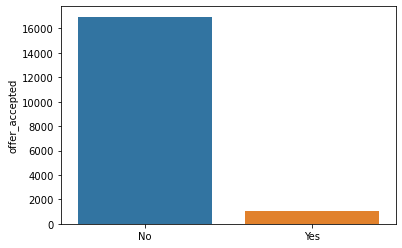

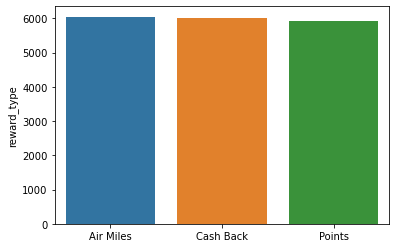

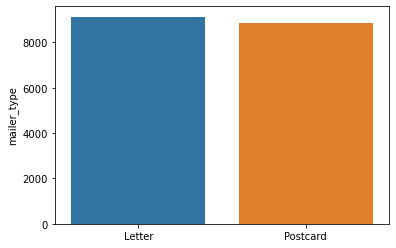

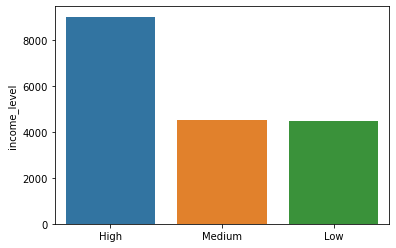

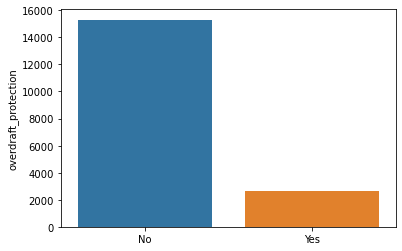

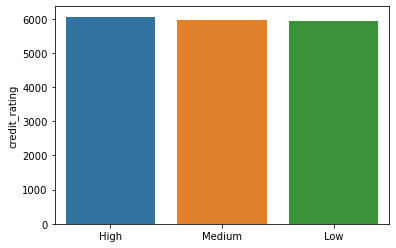

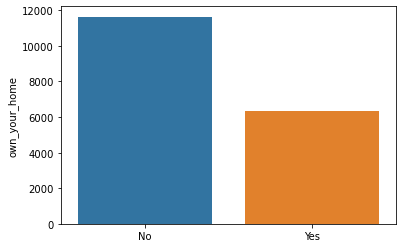

In [27]:
# plot Categoricals values
for i in list(categoricals.columns):
    sns.barplot(x=categoricals[i].unique(),y=categoricals[i].value_counts())
    plt.show()

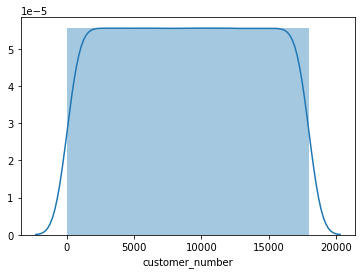

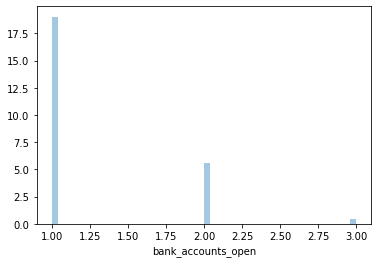

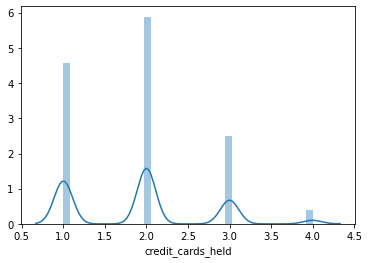

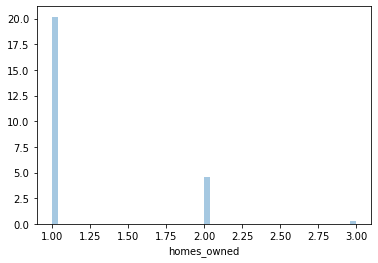

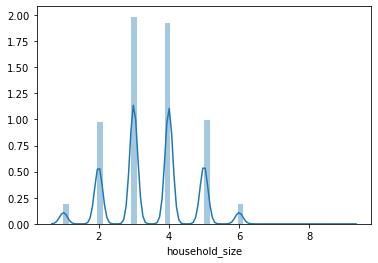

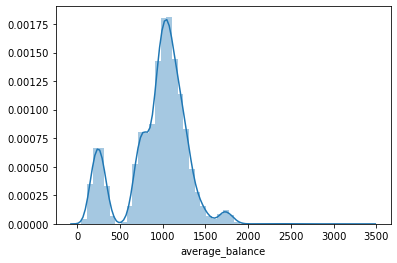

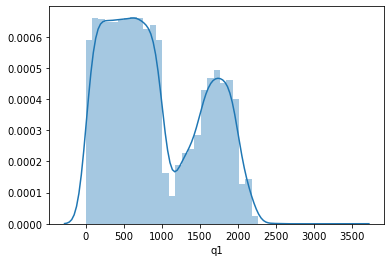

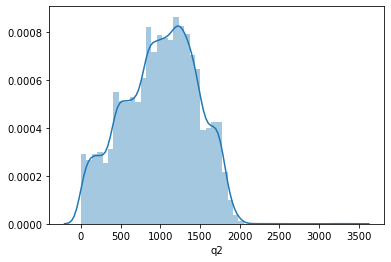

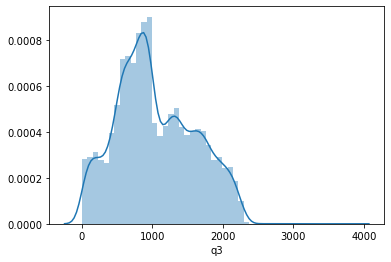

In [28]:
# plot Numericals values
for i in list(numericals.columns):
    sns.distplot(numericals[i])
    plt.show()

customer_number


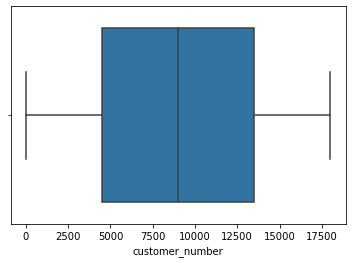

bank_accounts_open


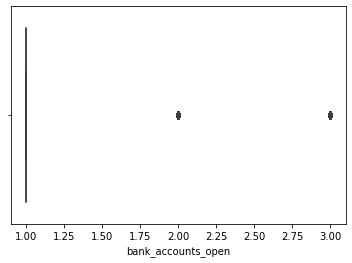

credit_cards_held


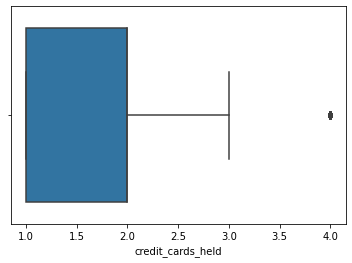

homes_owned


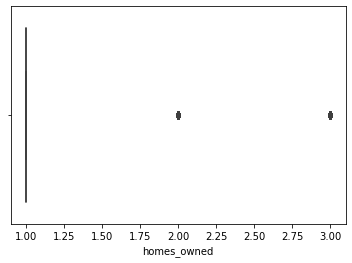

household_size


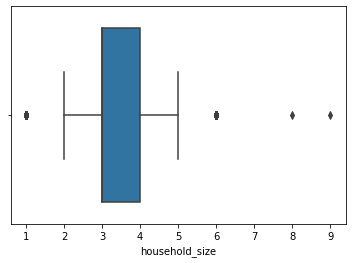

average_balance


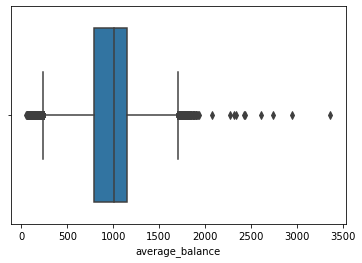

q1


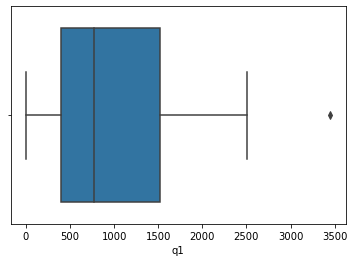

q2


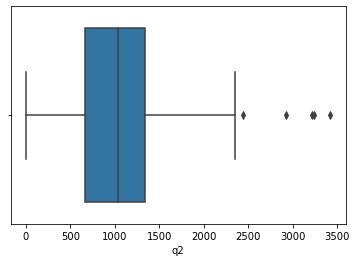

q3


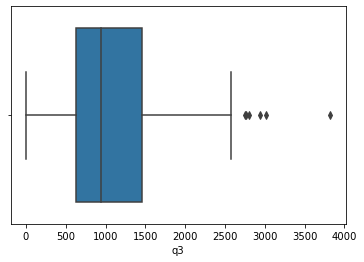

In [29]:
# Check outliers

for i in numericals.columns:
    print (i)
    sns.boxplot(x=numericals[i])
    plt.show()

Outliers are important for the model. They are necessary for the prediction. 
Data set is pretty clean so we don’t have to remove outliers.

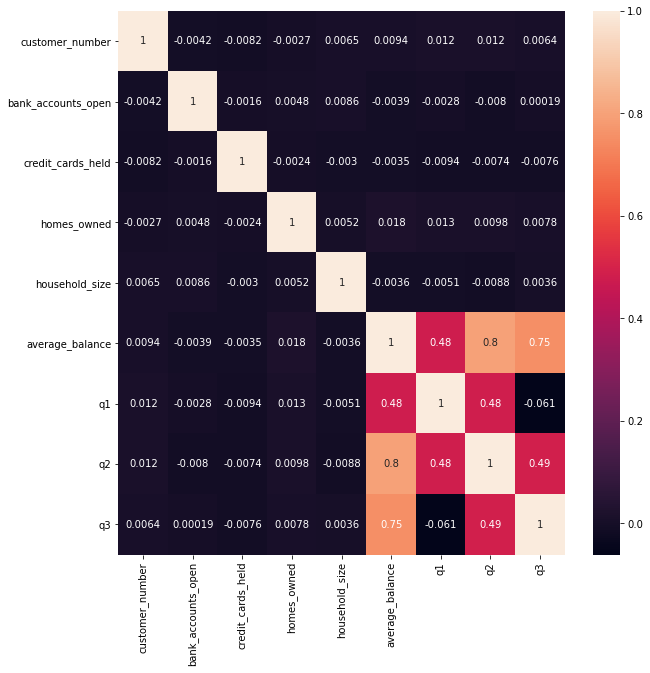

In [30]:
# Correlation matrix using pearson method for numericals values
corr_matrix=numericals.corr(method='pearson') # default
fig, ax = plt.subplots(figsize=(10, 10))
ax = sns.heatmap(corr_matrix, annot=True)
plt.show()

### Logistic Regression

In [31]:
# Normalizer

from sklearn.preprocessing import Normalizer
X = data.select_dtypes(include = np.number)

transformer = Normalizer().fit(X)
x_normalized = transformer.transform(X)
x = pd.DataFrame(x_normalized)

In [32]:
y = data['offer_accepted']
X = new_data

In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=100)

In [34]:
from sklearn.linear_model import LogisticRegression
classification = LogisticRegression(random_state=0, solver='lbfgs',
                  multi_class='multinomial').fit(X_train, y_train)

In [35]:
predictions = classification.predict(X_test)
print("The accuracy of the model is: %4.2f" % (classification.score(X_test, y_test)))

The accuracy of the model is: 0.94


In [37]:
from sklearn.metrics import cohen_kappa_score
print("The kappa of the logistic regression model is: %4.2f " %(cohen_kappa_score(predictions,y_test)) )

The kappa of the logistic regression model is: 0.00 


In [38]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
confusion_matrix(y_test, predictions)

array([[6786,    0],
       [ 404,    1]])

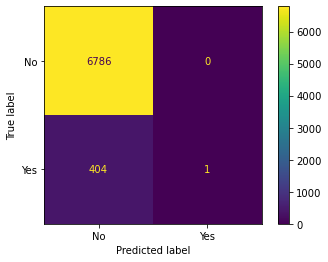

In [39]:
plot_confusion_matrix(classification, X_test, y_test) 

In [40]:
# Standardizer

from sklearn.preprocessing import StandardScaler
X2 = data.select_dtypes(include = np.number)

transformer = StandardScaler().fit(X2)
x_standarized = transformer.transform(X2)
x_standarized = pd.DataFrame(x_standarized)

In [41]:
y = data['offer_accepted']
X = new_data

In [42]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=100)

In [43]:
from sklearn.linear_model import LogisticRegression
classification = LogisticRegression(random_state=0, solver='lbfgs',
                  multi_class='multinomial').fit(X_train, y_train)

In [44]:
predictions = classification.predict(X_test)
print("The accuracy of the model is: %4.2f" % (classification.score(X_test, y_test)))

The accuracy of the model is: 0.94


In [45]:
from sklearn.metrics import cohen_kappa_score
print("The kappa of the logistic regression model is: %4.2f " %(cohen_kappa_score(predictions,y_test)) )

The kappa of the logistic regression model is: 0.00 


In [46]:
# Offer_accepted target variable : yes/no very unbalance... 
# We should use resample (try with undersample and oversample to see the difference)

### Oversampling

Imbalanced classification involves developing predictive models on classification datasets that have a severe class imbalance.

The challenge of working with imbalanced datasets is that most machine learning techniques will ignore, and in turn have poor performance on, the minority class, although typically it is performance on the minority class that is most important.

One approach to addressing imbalanced datasets is to oversample the minority class. The simplest approach involves duplicating examples in the minority class, although these examples don’t add any new information to the model. Instead, new examples can be synthesized from the existing examples. This is a type of data augmentation for the minority class and is referred to as the Synthetic Minority Oversampling Technique, or SMOTE for short.

In [47]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

In [48]:
smote = SMOTE(random_state=74)

# transformer = StandardScaler().fit(new_data)
# X = transformer.transform(new_data)
X_sm, y_sm = smote.fit_sample(X, y)
y_sm.value_counts()

No     16955
Yes    16955
Name: offer_accepted, dtype: int64

In [49]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()

X_sm, y_sm = smote.fit_sample(X, y)
y_sm = y_sm.to_numpy()
y_sm = pd.Series(data=y_sm.flatten())
y_sm.value_counts()

No     16955
Yes    16955
dtype: int64

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.2, random_state=58)

classification = LogisticRegression(random_state=0, multi_class='ovr').fit(X_train, y_train)
y_pred = classification.predict(X_test)
print("The accuracy of the logistic_regression model is: %4.2f "% (classification.score(X_test, y_test)))

from sklearn.metrics import cohen_kappa_score
print("The kappa of the logistic regression model is: %4.2f " %(cohen_kappa_score(y_pred,y_test)) )

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, labels=['Yes','No']))
print(X_sm)

The accuracy of the logistic_regression model is: 0.81 
The kappa of the logistic regression model is: 0.62 
              precision    recall  f1-score   support

         Yes       0.80      0.83      0.82      3413
          No       0.82      0.79      0.81      3369

    accuracy                           0.81      6782
   macro avg       0.81      0.81      0.81      6782
weighted avg       0.81      0.81      0.81      6782

       bank_accounts_open  credit_cards_held  homes_owned  household_size  \
0                       1                  2            1               4   
1                       1                  2            2               5   
2                       2                  2            1               2   
3                       2                  1            1               4   
4                       1                  2            1               6   
...                   ...                ...          ...             ...   
33905                   1

### Undersampling

Resampling methods are designed to change the composition of a training dataset for an imbalanced classification task.

Most of the attention of resampling methods for imbalanced classification is put on oversampling the minority class. Nevertheless, a suite of techniques has been developed for undersampling the majority class that can be used in conjunction with effective oversampling methods.

There are many different types of undersampling techniques, although most can be grouped into those that select examples to keep in the transformed dataset, those that select examples to delete, and hybrids that combine both types of methods.

In [51]:
from sklearn.utils import resample

#downsample majority
not_credit_downsampled, y_res = resample(X[y == "No"],y[y == "No"],
                                replace=False, # sample without replacemente
                                n_samples=len(X[y == "Yes"]), # match minority n
                                random_state=0) #reproducible results

# combine minority and downsampled majority
downsampled = pd.concat([not_credit_downsampled, X[y == "Yes"]])
y_res = pd.concat([y_res, y[y == "Yes"]])
y_res.value_counts()

No     1021
Yes    1021
Name: offer_accepted, dtype: int64

In [52]:
X_train, X_test, y_train, y_test = train_test_split(downsampled, y_res, test_size=0.2, random_state=58)

In [53]:
classification = LogisticRegression(random_state=0, multi_class='ovr', max_iter=10000).fit(X_train, y_train)

In [54]:
print("The accuracy of the logistic_regression model is: %4.2f "% (classification.score(X_test, y_test)))

The accuracy of the logistic_regression model is: 0.67 


In [55]:
y_pred = classification.predict(X_test)
print("The kappa of the logistic regression model is: %4.2f " %(cohen_kappa_score(y_pred,y_test)) )

The kappa of the logistic regression model is: 0.34 


### Random Forest

In [56]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.2, random_state=56)

In [58]:
#    svc = SVC(random_state=42)    svc.fit(X_train, y_train)
clf = RandomForestClassifier(random_state=56).fit(X_train, y_train.values.ravel())

In [59]:
y_pred = clf.predict(X_test)

In [60]:
print("The accuracy of the model is: %4.2f" % (clf.score(X_test, y_test)))

The accuracy of the model is: 0.91


In [85]:
print("The kappa of the logistic regression model is: %4.2f " %(cohen_kappa_score(y_pred,y_test)) )

The kappa of the logistic regression model is: 1.00 


In [64]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [65]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


In [66]:
# Model (can also use single decision tree)
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=10)

# Train
model.fit(X_train, y_train.values.ravel())

# Extract single tree
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz

In [67]:
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_sm.T,
                class_names = y_sm.T,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

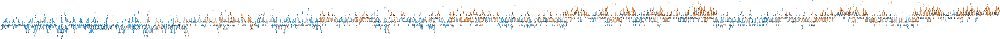

In [68]:
# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

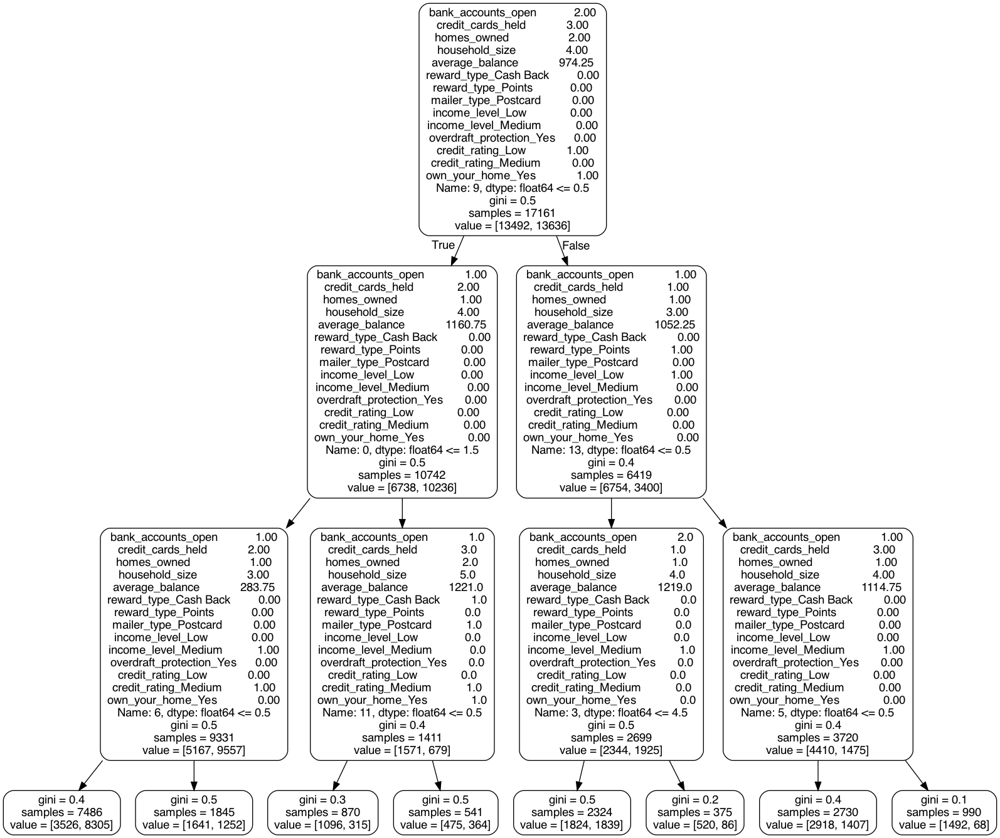

In [70]:
import pydot

# Limit depth of tree to 3 levels
model_small = RandomForestClassifier(n_estimators=10, max_depth = 3)
model_small.fit(X_train, y_train.values.ravel())

# Extract the small tree
tree_small = model_small.estimators_[5]
# Save the tree as a png image
export_graphviz(tree_small, out_file = 'small_tree.dot', 
                feature_names = X_sm.T, 
                rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')
graph.write_png('small_tree.png');

from IPython.display import Image
Image(filename = 'small_tree.png')

### KNN

In [71]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

neighbors = list(range(1,9,2)) # Creating odd list K for KNN, avoiding evens incase of ties

cv_scores = [ ] #list that will hold cv scores

#perform 10-fold cross-validation
for K in neighbors:
    knn = KNeighborsClassifier(n_neighbors = K)
    scores = cross_val_score(knn,X_train,y_train.values.ravel(),cv = 10,scoring ="accuracy")
    cv_scores.append(scores.mean())

<function matplotlib.pyplot.show(*args, **kw)>

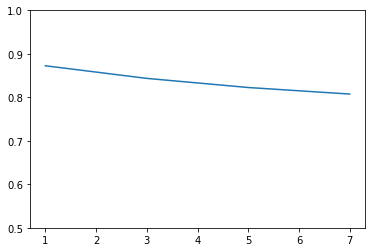

In [72]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

neighbors = list(range(1,9,2)) # Creating odd list K for KNN, avoiding evens incase of ties

cv_scores = [ ] #list that will hold cv scores

#perform 10-fold cross-validation
for K in neighbors:
    knn = KNeighborsClassifier(n_neighbors = K)
    scores = cross_val_score(knn,X_train,y_train.values.ravel(),cv = 10,scoring ="accuracy")
    cv_scores.append(scores.mean()) #Plot the cv_scores results
sns.lineplot(x = neighbors, y = cv_scores)
plt.ylim(0.5,1)
plt.show

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.2, random_state=56)
neigh = KNeighborsClassifier(n_neighbors=1).fit(X_train, y_train.values.ravel())

### Trying other things...

In [ ]:
# drop other columns such as Mailer type and Credit Rating
new_data_drop = new_data.drop(['mailer_type_Postcard'], axis=1)
new_data_drop = new_data.drop(['credit_rating_Medium'], axis=1)
new_data_drop = new_data.drop(['credit_rating_Low'], axis=1)
new_data_drop

In [ ]:
# Normalizer

from sklearn.preprocessing import Normalizer
X = data.select_dtypes(include = np.number)

transformer = Normalizer().fit(X)
x_normalized = transformer.transform(X)
x = pd.DataFrame(x_normalized)

In [ ]:
y = data['offer_accepted']
X = new_data_drop

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=100)

In [ ]:
from sklearn.linear_model import LogisticRegression
classification = LogisticRegression(random_state=0, solver='lbfgs',
                  multi_class='multinomial').fit(X_train, y_train)

In [ ]:
predictions = classification.predict(X_test)
print("The accuracy of the model is: %4.2f" % (classification.score(X_test, y_test)))

In [ ]:
print("The kappa of the logistic regression model is: %4.2f " %(cohen_kappa_score(predictions,y_test)) )

In [74]:
# trying with bins
def avg_bal_bins(x):
    if x < 520:
        return "Low"
    elif x < 875:
        return "Lower-Mid"
    elif x < 1600:
        return "Higher-Mid"
    else:
        return "High"

In [88]:
df_num2 = numericals
Avg_Bal_Bins = pd.get_dummies(df_num2["average_balance"].apply(avg_bal_bins))
df_num2 = df_num2.drop("average_balance", axis = 1)
df_num2

,customer_number,bank_accounts_open,credit_cards_held,homes_owned,household_size,q1,q2,q3
customer_number,,,,,,,,
1,1,1,2,1,4,1669,877,1095
2,2,1,2,2,5,39,106,78
3,3,2,2,1,2,367,352,145
4,4,2,1,1,4,1578,1760,1119
5,5,1,2,1,6,2140,1357,982
...,...,...,...,...,...,...,...,...
17996,17996,1,1,1,5,136,65,71
17997,17997,1,3,1,3,984,940,943
17998,17998,1,2,1,4,918,767,1170


In [76]:
X_bin = pd.concat([categorical_dummies, Avg_Bal_Bins, df_num2], axis = 1)
y_bin = y

X_bin, y_bin = smote.fit_sample(X_bin, y_bin)
y_bin = y_bin.to_numpy()
y_bin = pd.Series(data=y_bin.flatten())
y_bin.value_counts()

No     16955
Yes    16955
dtype: int64

In [77]:
X_train, X_test, y_train, y_test = train_test_split(X_bin, y_bin, test_size=0.2, random_state=56)
clf_bin = RandomForestClassifier(random_state=0).fit(X_train, y_train.values.ravel())

In [78]:
y_pred = clf_bin.predict(X_test)

In [89]:
print("The accuracy of the model is: %4.2f" % (clf_bin.score(X_test, y_test)))

The accuracy of the model is: 1.00


In [80]:
print("The kappa of the logistic regression model is: %4.2f " %(cohen_kappa_score(y_pred,y_test)) )

The kappa of the logistic regression model is: 1.00 
